## Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import pickle as pkl
from datetime import datetime
from dateutil import parser

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
plt.rcParams['figure.figsize'] = (12.0, 8.0)
plt.rcParams['axes.axisbelow'] = True

from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import plotly.io as pio
init_notebook_mode(True)

from hallprobecalib import hpc_ext_path
from hallprobecalib.hpcplots import scatter2d,scatter3d,histo

## Day 1: Cleaning, Plots

In [3]:
plotdir = hpc_ext_path+'plots/magnet_stability/2019-07-02/'

In [4]:
directory = "/home/ckampa/Dropbox/LogFiles/"#hpc_ext_path+'datafiles/magnet_stability/nmr/'
filename = '2019-07-02 151328slow.txt'

In [5]:
df = pd.read_csv(directory+filename)

In [6]:
df_full = pd.read_csv(directory+filename)

In [11]:
df.describe()

,Magnet Current [V],Magnet Voltage [V],Coil 1 (new),Coil 2 (old),LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke,Hall Element,...,LCW to magnet,NMR [T],NMR [FFT],Zaber_Meas_MicroStep_X,Zaber_Meas_Encoder_X,Zaber_Meas_MicroStep_Y,Zaber_Meas_Encoder_Y,Zaber_Meas_MicroStep_Z,Zaber_Meas_Encoder_Z,
count,1328.000000,1328.000000,1328.000000,1328.000000,1328.000000,1328.000000,1328.000000,1328.000000,1328.000000,1328.000000,...,1328.000000,1328.000000,1328.0,1328.0000,1328.0,1328.00,1328.0,1328.000,1328.0,0.0
mean,2.053293,9.289146,32.397159,31.572564,26.152906,26.923807,25.530980,27.975383,22.521520,16.989599,...,26.472590,0.330327,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN
std,3.495135,15.817933,14.933351,13.697193,2.045119,3.616629,3.537893,5.987068,4.747070,2.962614,...,1.880718,0.562198,0.0,0.0000,0.0,0.00,0.0,0.000,0.0,NaN
min,-0.000104,-0.000034,22.750301,22.712351,24.393843,24.199186,22.664261,23.785473,17.777729,14.449540,...,24.877581,0.000000,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN
25%,-0.000102,-0.000006,22.922055,22.857982,24.591729,24.406186,22.965205,23.978861,18.163056,14.673840,...,25.069405,0.000000,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN
50%,-0.000101,-0.000005,23.422879,23.351830,25.080683,24.878860,23.504171,24.488883,20.165278,15.107214,...,25.509643,0.000000,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN
75%,8.002176,36.211229,57.241482,54.415762,29.316763,32.765306,31.186254,37.811643,29.122718,21.417931,...,29.391932,1.286425,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN
max,8.002187,36.260800,57.781006,54.848282,29.713877,33.181942,31.620123,38.244102,29.370728,21.894438,...,29.774338,1.286446,0.0,210351.5625,538500.0,178906.25,458000.0,642578.125,1645000.0,NaN


In [7]:
df = df[df[" NMR [T]"] != 0]

In [13]:
fig = histo(df[' NMR [T]'],bins=50,yscale='linear',inline=True);

In [14]:
fname = 'hist_NMR'
pio.write_image(fig, plotdir+fname+'.pdf')
pio.write_image(fig, plotdir+fname+'.png')
plot(fig, filename=plotdir+fname+'.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-07-02/hist_NMR.html'

In [8]:
dates = [parser.parse(row.Time) for row in df.itertuples()]# if isdatetime(row.Time.values[0])]

- NOTE: 'as.type("str")' is necessary to ensure plotly doesn't convert datetime to UTC!

In [9]:
df["Datetime"] = pd.to_datetime(dates).astype("str")
df = df.set_index("Datetime")

In [10]:
dates = [parser.parse(row.Time) for row in df_full.itertuples()]# if isdatetime(row.Time.values[0])]

- NOTE: 'as.type("str")' is necessary to ensure plotly doesn't convert datetime to UTC!

In [11]:
df_full["Datetime"] = pd.to_datetime(dates).astype("str")
df_full = df_full.set_index("Datetime")

In [19]:
fig = scatter2d(df_full.index,df_full[" NMR [T]"],lines=True,markers=False,size_list=[6],inline=True)

In [20]:
pio.write_image(fig, plotdir+'NMR_vs_Time_full.pdf')
pio.write_image(fig, plotdir+'NMR_vs_Time_full.png')
plot(fig, filename=plotdir+'NMR_vs_Time_full.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-07-02/NMR_vs_Time_full.html'

In [21]:
fig = scatter2d(df.index,df[" NMR [T]"],lines=True,markers=False,size_list=[6],inline=True)

In [22]:
nmr =df[' NMR [T]']
(nmr.max() - nmr.min()) / nmr.mean()

1.7117830096137697e-05

In [23]:
pio.write_image(fig, plotdir+'NMR_vs_Time.pdf')
pio.write_image(fig, plotdir+'NMR_vs_Time.png')
plot(fig, filename=plotdir+'NMR_vs_Time.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-07-02/NMR_vs_Time.html'

In [24]:
df.columns

Index(['Time', ' Magnet Current [V]', ' Magnet Voltage [V]', 'Coil 1 (new)',
       ' Coil 2 (old)', ' LCW in Coil1', ' LCW out Coil 1', ' LCW in Coil 2',
       ' LCW out Coil 2', ' Yoke', ' Hall Element', ' Floor', ' Roof',
       'Parameter HVAC return', ' Parameter HVAC sensor', ' CH13', ' CH14',
       ' CH15', ' CH16', ' CH17', ' CH18', ' CH19', ' CH20', 'CH21', ' CH22',
       ' CH23', ' CH24', ' CH25', ' CH26', ' PS internal', ' PS Vent1',
       ' PS Vent2', ' TrippLite HVAC supply', ' Tripplite HVAC exhaust',
       'LCW to PS', ' LCW in barrel', ' ICW in', ' ICW HE1 out',
       ' ICW He2 out', ' LCW return magnet', ' LCW to barrel', ' LCW from PS',
       'LCW to magnet', ' NMR [T]', ' NMR [FFT]', ' Zaber_Meas_MicroStep_X',
       ' Zaber_Meas_Encoder_X', '  Zaber_Meas_MicroStep_Y',
       ' Zaber_Meas_Encoder_Y', '  Zaber_Meas_MicroStep_Z',
       ' Zaber_Meas_Encoder_Z', ' '],
      dtype='object')

In [25]:
len(df.columns)

52

In [26]:
#df = df_full

In [12]:
temps_ch = [a for a in df.columns if ("CH" in a) and int(a[-2:])<21]# or "HVAC" in a]
temps_ch.append(" Hall Element")
temps_ch.append(" Floor")
temps_ch.append(" Roof")
temps_ch.append(" Yoke")

In [13]:
temps_ch

[' CH13',
 ' CH14',
 ' CH15',
 ' CH16',
 ' CH17',
 ' CH18',
 ' CH19',
 ' CH20',
 ' Hall Element',
 ' Floor',
 ' Roof',
 ' Yoke']

In [29]:
df[temps_ch].describe()

,CH13,CH14,CH15,CH16,CH17,CH18,CH19,CH20,Hall Element,Floor,Roof,Yoke
count,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000,341.000000
mean,19.675589,20.933105,20.958700,20.342989,18.856845,19.188535,18.605615,18.198563,21.574331,21.838259,17.994312,29.236314
std,0.071256,0.062401,0.061872,0.055011,0.059063,0.056623,0.061362,0.061207,0.098419,0.059704,0.062311,0.073285
min,19.513222,20.819603,20.836769,20.230064,18.745062,19.079235,18.490316,18.091494,21.353077,21.733976,17.862644,29.086803
25%,19.624001,20.877134,20.903631,20.298388,18.803637,19.143982,18.547083,18.141050,21.500439,21.786827,17.943733,29.181593
50%,19.681746,20.937965,20.962362,20.342123,18.860821,19.189842,18.609148,18.197123,21.566429,21.836025,17.990324,29.233971
75%,19.730482,20.983910,21.010939,20.389513,18.902281,19.230402,18.661715,18.254669,21.638767,21.893377,18.041979,29.292080
max,19.851084,21.064348,21.083717,20.447882,18.995193,19.305342,18.716539,18.307798,21.894438,21.943815,18.127508,29.370728


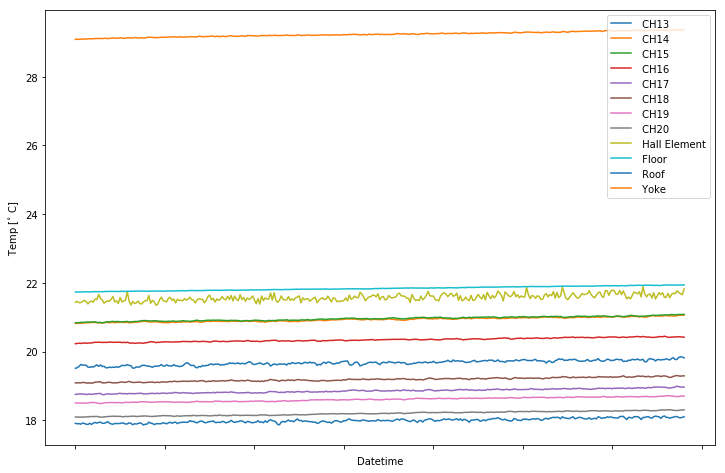

In [30]:
fig = plt.figure()
for c in temps_ch:
    df[c].plot()
#plt.ylabel('Temp [C]')
plt.ylabel("Temp [$^{\circ}$ C]")
plt.legend()    

In [31]:
fig = scatter2d([df.index for c in temps_ch],[df[c] for c in temps_ch],inline=True);
fig.layout.title = "Temp vs. Datetime"
fig.layout.yaxis.title = "Temp [deg. C]"

In [32]:
#fname = 'temps_scatter'
fname = 'temps_scatter_full'
pio.write_image(fig, plotdir+fname+'.pdf')
pio.write_image(fig, plotdir+fname+'.png')
plot(fig, filename=plotdir+fname+'.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-07-02/temps_scatter_full.html'

In [33]:
fig = scatter2d(df.index,df["CH21"],inline=True)

In [34]:
fig = scatter2d([df.index for c in temps_ch],[df[c]-(df[c].mean()-df[" Floor"].mean()) for c in temps_ch],inline=True);
fig.layout.title = "Temp vs. Datetime"
fig.layout.yaxis.title = "Temp [deg. C]"

In [35]:
fname = 'temps_scatter_adjusted'
pio.write_image(fig, plotdir+fname+'.pdf')
pio.write_image(fig, plotdir+fname+'.png')
plot(fig, filename=plotdir+fname+'.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-07-02/temps_scatter_adjusted.html'

In [14]:
fig = histo([df[c]-(df[c].mean()-df[" Floor"].mean()) for c in temps_ch],xlabel="Temperature (deg C)",verbosity=1,opacity=0.6,inline=True);
fig.layout.title = "Temp Histos"

In [37]:
fname = 'hist_temps_adjusted'
pio.write_image(fig, plotdir+fname+'.pdf')
pio.write_image(fig, plotdir+fname+'.png')
plot(fig, filename=plotdir+fname+'.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-07-02/hist_temps_adjusted.html'

In [38]:
fig = histo([df[c] for c in temps_ch],xlabel="Temperature (deg C)",verbosity=1,inline=True);
fig.layout.title = "Temp Histos"

In [39]:
fname = 'hist_temps'
pio.write_image(fig, plotdir+fname+'.pdf')
pio.write_image(fig, plotdir+fname+'.png')
plot(fig, filename=plotdir+fname+'.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-07-02/hist_temps.html'

In [40]:
fig = scatter2d(df.index,df[" Yoke"],inline=True);

In [41]:
fig = histo(df["CH21"],bins=50,inline=True);
pio.write_image(fig,plotdir+"hist_temp_Desk.pdf")
pio.write_image(fig,plotdir+"hist_temp_Desk.png")
fig = histo(df[" Floor"],bins=50,inline=True);
pio.write_image(fig,plotdir+"hist_temp_Floor.pdf")
pio.write_image(fig,plotdir+"hist_temp_Floor.png")

In [42]:
fig = histo(df[" Roof"],bins=50,inline=True);

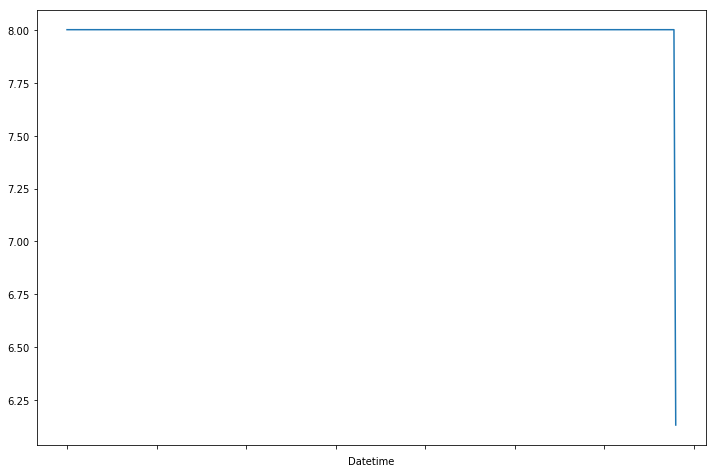

In [43]:
df[' Magnet Current [V]'].plot()

In [44]:
fig = scatter2d(df.index,df[' Magnet Current [V]'],inline=True);

In [45]:
fname = 'magnet_current'
pio.write_image(fig, plotdir+fname+'.pdf')
pio.write_image(fig, plotdir+fname+'.png')
plot(fig, filename=plotdir+fname+'.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-07-02/magnet_current.html'

In [46]:
fig = scatter2d(df.index,df[' Magnet Voltage [V]'],inline=True);

In [47]:
fname = 'magnet_voltage'
pio.write_image(fig, plotdir+fname+'.pdf')
pio.write_image(fig, plotdir+fname+'.png')
plot(fig, filename=plotdir+fname+'.html')

'file:///home/ckampa/Coding/hallprobecalib_extras/plots/magnet_stability/2019-07-02/magnet_voltage.html'

In [48]:
m =df[' Magnet Voltage [V]']
(m.max() - m.min()) / m.mean()

0.5184019985651586

In [49]:
for col in df.columns:
    fig = scatter2d(df.index,df[col],lines=True,markers=False,size_list=[6], show_plot=False,inline=True);
    pio.write_image(fig,plotdir+f"time_series/{col}.pdf")
    pio.write_image(fig,plotdir+f"time_series/{col}.png")

In [50]:
for col in df_full.columns:
    fig = scatter2d(df_full.index,df_full[col],lines=True,markers=False,size_list=[6], show_plot=False,inline=True);
    pio.write_image(fig,plotdir+f"time_series_full/{col}.pdf")
    pio.write_image(fig,plotdir+f"time_series_full/{col}.png")

## Correlations

- As seen in past dataset, NMR reading seems inversely correlated to the magnet voltage.
- It also appeared that the voltage was correlated to the water cooling system.
- Let's check if this relationship holds and also try to tease out other correlations.

In [51]:
import operator
from scipy import stats

In [52]:
ns = []
for col in df.columns:
    if (df[col].dtype == np.float64) & ("Zab" not in col) & ("NMR [FFT]" not in col) & (col != " "):
        ns.append(col)

In [53]:
len(df.columns)

52

In [54]:
len(ns)

43

In [55]:
df[ns].corr()

,Magnet Current [V],Magnet Voltage [V],Coil 1 (new),Coil 2 (old),LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke,Hall Element,...,LCW to PS,LCW in barrel,ICW in,ICW HE1 out,ICW He2 out,LCW return magnet,LCW to barrel,LCW from PS,LCW to magnet,NMR [T]
Magnet Current [V],1.000000,0.999894,-0.100065,-0.098237,-0.106868,-0.092245,-0.096163,-0.084649,-0.098310,-0.138487,...,-0.117994,-0.122049,-0.108147,-0.104397,-0.105545,-0.099795,-0.105668,-0.097519,-0.104928,0.111175
Magnet Voltage [V],0.999894,1.000000,-0.088859,-0.084891,-0.092505,-0.078106,-0.082692,-0.070574,-0.084420,-0.129262,...,-0.103619,-0.107862,-0.093944,-0.090074,-0.091242,-0.086974,-0.091309,-0.083584,-0.090528,0.096887
Coil 1 (new),-0.100065,-0.088859,1.000000,0.794033,0.777062,0.776791,0.741840,0.769675,0.758488,0.728270,...,0.767627,0.762470,0.758476,0.763068,0.765363,0.694414,0.765657,0.746512,0.768408,-0.772021
Coil 2 (old),-0.098237,-0.084891,0.794033,1.000000,0.921764,0.917226,0.883534,0.894717,0.897567,0.717316,...,0.915947,0.909049,0.902939,0.908351,0.907858,0.814333,0.912238,0.879054,0.911905,-0.911468
LCW in Coil1,-0.106868,-0.092505,0.777062,0.921764,1.000000,0.983614,0.928916,0.968820,0.948827,0.662949,...,0.981943,0.970527,0.979934,0.987328,0.987030,0.883154,0.987976,0.958499,0.992781,-0.978194
LCW out Coil 1,-0.092245,-0.078106,0.776791,0.917226,0.983614,1.000000,0.907567,0.961022,0.936493,0.699108,...,0.968608,0.958016,0.962665,0.969551,0.971742,0.875992,0.972978,0.944623,0.976126,-0.962710
LCW in Coil 2,-0.096163,-0.082692,0.741840,0.883534,0.928916,0.907567,1.000000,0.863591,0.908968,0.677557,...,0.921099,0.908528,0.912340,0.923577,0.917146,0.809448,0.923415,0.883838,0.923294,-0.924689
LCW out Coil 2,-0.084649,-0.070574,0.769675,0.894717,0.968820,0.961022,0.863591,1.000000,0.927196,0.656078,...,0.961096,0.949361,0.957396,0.964086,0.965269,0.863996,0.963659,0.936505,0.970103,-0.953653
Yoke,-0.098310,-0.084420,0.758488,0.897567,0.948827,0.936493,0.908968,0.927196,1.000000,0.685538,...,0.952875,0.945964,0.910974,0.931947,0.934033,0.839737,0.939916,0.910190,0.944009,-0.985054
Hall Element,-0.138487,-0.129262,0.728270,0.717316,0.662949,0.699108,0.677557,0.656078,0.685538,1.000000,...,0.637867,0.636053,0.617716,0.629271,0.638174,0.570996,0.636088,0.616732,0.639004,-0.661442


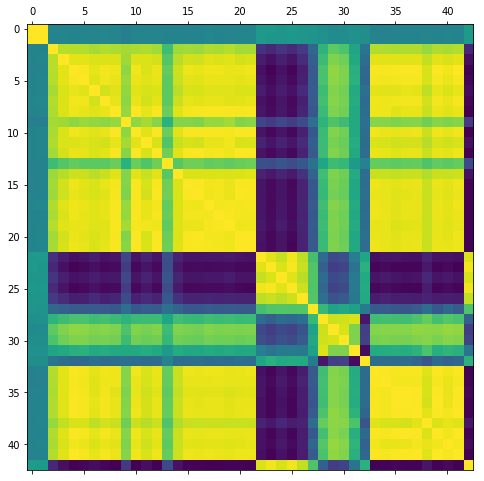

In [56]:
plt.matshow(df[ns].corr())

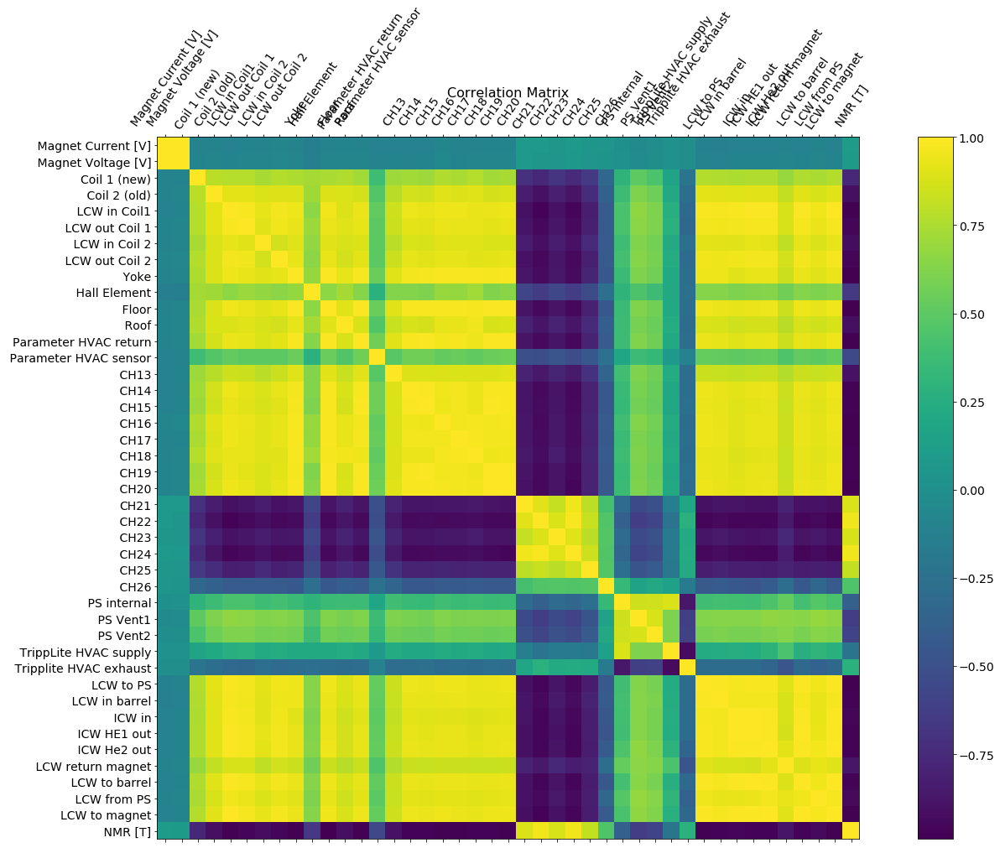

In [57]:
f = plt.figure(figsize=(25, 15))
plt.matshow(df[ns].corr(), fignum=f.number)
plt.xticks(range(df[ns].shape[1]), df[ns].columns, fontsize=14, rotation=55)
plt.yticks(range(df[ns].shape[1]), df[ns].columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

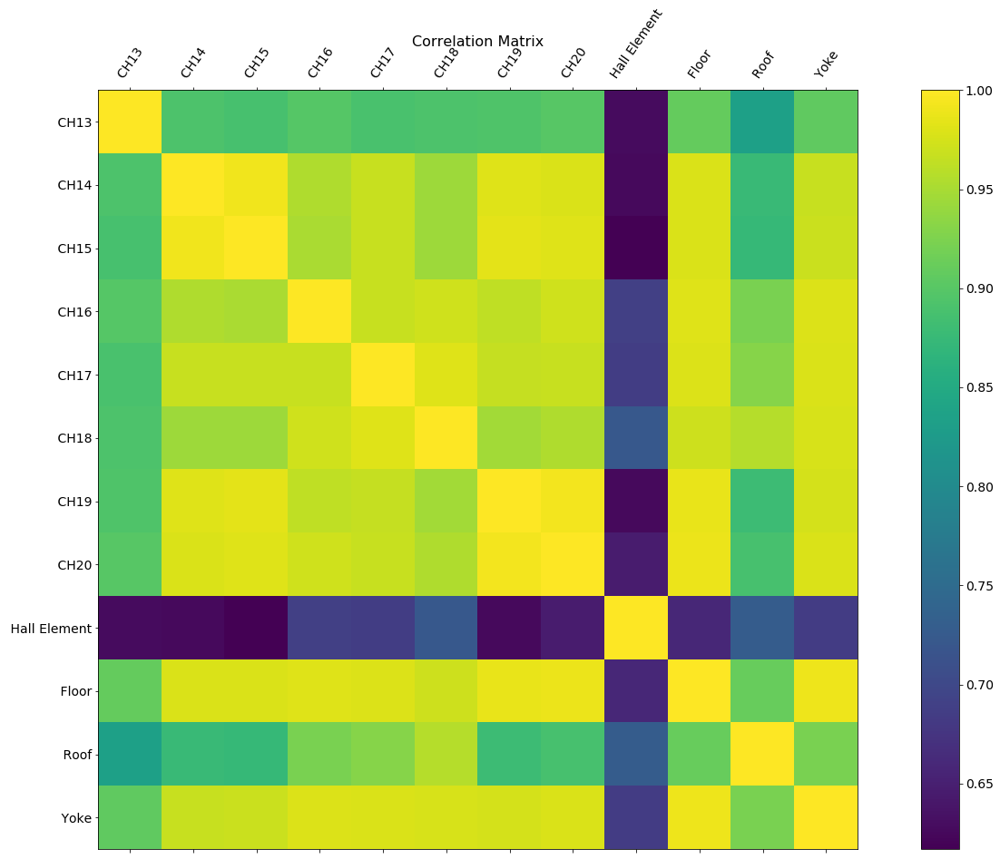

In [58]:
f = plt.figure(figsize=(25, 15))
plt.matshow(df[temps_ch].corr(), fignum=f.number)
plt.xticks(range(df[temps_ch].shape[1]), df[temps_ch].columns, fontsize=14, rotation=55)
plt.yticks(range(df[temps_ch].shape[1]), df[temps_ch].columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

In [59]:
#corr.style.background_gradient(cmap='coolwarm', axis=None)
#df.corr().style.background_gradient(cmap='coolwarm', axis=None)
df[ns].corr().style.background_gradient(cmap='coolwarm').set_precision(2)

In [60]:
primary_corr = dict()
for col in df.columns:
    if df[col].dtype == np.float64:
        slope_v, intercept_v, r_value_v, p_value_v, std_err_v = stats.linregress(df[col], df[" NMR [T]"])
        #print(col,r_value_v,p_value_v,std_err_v)
        primary_corr[col] = r_value_v

sorted_primary_corr = sorted(primary_corr.items(), key=operator.itemgetter(1))

sorted_primary_corr

/home/ckampa/anaconda3/envs/Mu2E/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:107: RuntimeWarning:

invalid value encountered in double_scalars

/home/ckampa/anaconda3/envs/Mu2E/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:119: RuntimeWarning:

divide by zero encountered in double_scalars



[(' Floor', -0.9898435805106839),
 (' Yoke', -0.9850535420003462),
 ('LCW to PS', -0.9795535787151372),
 (' CH20', -0.9783887739767018),
 (' LCW in Coil1', -0.978194482347675),
 ('LCW to magnet', -0.9774195307773633),
 (' CH16', -0.9760456778321569),
 (' CH17', -0.9757098909838202),
 ('Parameter HVAC return', -0.9752839359204217),
 (' CH19', -0.9739753758142107),
 (' CH14', -0.9736974269446387),
 (' LCW to barrel', -0.9730644803904651),
 (' ICW HE1 out', -0.9691408218483675),
 (' ICW He2 out', -0.9690778777177524),
 (' CH15', -0.9688323686868779),
 (' LCW in barrel', -0.9684821868488318),
 (' CH18', -0.9676743272947661),
 (' LCW out Coil 1', -0.9627098349127267),
 (' ICW in', -0.9545566765068153),
 (' LCW out Coil 2', -0.9536533510348916),
 (' LCW from PS', -0.9423752695172863),
 (' LCW in Coil 2', -0.9246894128802913),
 (' Roof', -0.9119325580576371),
 (' Coil 2 (old)', -0.9114678119517075),
 (' CH13', -0.894274934491292),
 (' LCW return magnet', -0.8720071448461831),
 ('Coil 1 (new)'

Would be helpful to see time as the color to see how this is traced out.

In [61]:
df['ind'] = np.array([i for i in range(len(df))])

In [62]:
def color_scatter2d(x,y,ind,time=df.index,show_plot=True):
    data = [
        go.Scatter(
            x=x,
            y=y,
            marker=dict(
                size=2,
                cmax=ind.max(),
                cmin=ind.min(),
                color=ind,
                colorbar=dict(
                    title='time (index)',
                    #ticktext=df.index
                ),
                colorscale='Viridis',
            ),
            mode='markers',
            text=time,
        )
    ]
    
    layout = go.Layout(
        title = f"{y.name} vs. {x.name}",
        xaxis = dict(
            title = f"{x.name}"
        ),
        yaxis = dict(
            title = f"{y.name}"
        ),
    )

    fig = go.Figure(data=data,layout=layout)
    if show_plot:
        iplot(fig)
    return fig

In [63]:
for col in df.columns:
    fig = color_scatter2d(df[col],df[" NMR [T]"],df.ind,show_plot=False);
    pio.write_image(fig,plotdir+f"nmr_correlations/{col}_vs_nmr.pdf")
    pio.write_image(fig,plotdir+f"nmr_correlations/{col}_vs_nmr.png")

In [64]:
df_back = df

In [106]:
df = df_back

In [82]:
df_ = df[df.ind < 1600]

In [107]:
fig = color_scatter2d(df[" Yoke"],df[" NMR [T]"],df.ind,show_plot=True);

In [83]:
df = df_

In [71]:
#corr_main = " LCW in barrel"
#corr_main = " Yoke"
corr_main = " Floor"

filestart = corr_main.strip().lower()

#slope, intercept, r_value, p_value, std_err = stats.linregress(df[" Yoke"], df[" NMR [T]"])
slope, intercept, r_value, p_value, std_err = stats.linregress(df[corr_main], df[" NMR [T]"])

In [67]:
slope, intercept, r_value, p_value, std_err

(-0.00010175862466569151,
 1.2886586472961963,
 -0.9898435805106839,
 2.7119018151877283e-289,
 7.937515618424573e-07)

In [68]:
line = slope * df[corr_main] + intercept

In [69]:
fig = scatter2d(2*[df[corr_main]],[df[" NMR [T]"],line],lines=False,markers=True,size_list=[2,2],inline=True)

In [72]:
pio.write_image(fig,plotdir+f"{filestart}_vs_nmr_fit.pdf")
pio.write_image(fig,plotdir+f"{filestart}_vs_nmr_fit.png")

In [73]:
df["NMR_const"] = df[" NMR [T]"] - slope * df[corr_main] - intercept + df[" NMR [T]"].mean()

In [74]:
fig = scatter2d(2*[df[corr_main]],[df["NMR_const"],line],lines=False,markers=True,size_list=[2,2],inline=True)

In [76]:
pio.write_image(fig,plotdir+f"{filestart}_vs_nmr_fit_subtract.pdf")
pio.write_image(fig,plotdir+f"{filestart}_vs_nmr_fit_subtract.png")

In [77]:
fig = histo(df[" NMR [T]"],bins=50,inline=True);
pio.write_image(fig,plotdir+f"hist_NMR.pdf")
pio.write_image(fig,plotdir+f"hist_NMR.png")
fig = histo(df["NMR_const"],bins=50,inline=True);
pio.write_image(fig,plotdir+f"{filestart}_correction_nmr_hist.pdf")
pio.write_image(fig,plotdir+f"{filestart}_correction_nmr_hist.png")

This looks nice. Let's try to remake the correlation plots on NMR_const.

In [78]:
secondary_corr = dict()
for col in df.columns:
    if df[col].dtype == np.float64:
        slope_v, intercept_v, r_value_v, p_value_v, std_err_v = stats.linregress(df[col], df["NMR_const"])
        #print(col,r_value_v,p_value_v,std_err_v)
        secondary_corr[col] = r_value_v

sorted_corr = sorted(secondary_corr.items(), key=operator.itemgetter(1))

sorted_corr

/home/ckampa/anaconda3/envs/Mu2E/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:107: RuntimeWarning:

invalid value encountered in double_scalars

/home/ckampa/anaconda3/envs/Mu2E/lib/python3.7/site-packages/scipy/stats/_stats_mstats_common.py:119: RuntimeWarning:

divide by zero encountered in double_scalars



[(' ICW in', -0.2841358280323536),
 (' LCW return magnet', -0.2705186191577549),
 (' LCW in barrel', -0.2420272516345478),
 (' ICW HE1 out', -0.24169606387551043),
 ('LCW to PS', -0.23447907629766834),
 (' LCW to barrel', -0.2320556871651094),
 (' ICW He2 out', -0.2261030384352728),
 (' LCW out Coil 1', -0.21934364050573804),
 (' LCW out Coil 2', -0.21720262577423913),
 ('LCW to magnet', -0.21444864259432242),
 ('Coil 1 (new)', -0.21393292988697446),
 (' LCW in Coil1', -0.20460753731022097),
 (' LCW from PS', -0.19849992321225496),
 (' Coil 2 (old)', -0.1882416890614528),
 (' LCW in Coil 2', -0.16005904810375532),
 (' PS Vent2', -0.12804300596900978),
 (' PS internal', -0.09492366947082707),
 (' TrippLite HVAC supply', -0.08462603977162807),
 (' Roof', -0.07368176062216912),
 (' PS Vent1', -0.0687078862563008),
 (' Hall Element', -0.06425990199863495),
 (' CH18', -0.04659041383073588),
 (' CH17', -0.04113036422448139),
 (' CH14', -0.03819512201314908),
 (' Yoke', -0.03330136687723856),

In [79]:
for col in df.columns:
    fig = color_scatter2d(df[col],df["NMR_const"],df.ind,show_plot=False);
    pio.write_image(fig,plotdir+f"nmr_const_correlations/{col}_vs_nmr.pdf")
    pio.write_image(fig,plotdir+f"nmr_const_correlations/{col}_vs_nmr.png")

The water temperature or maybe magnet voltage seem correlated now, except for a weird bit at the end. So we do a similar fit and subtract based on data with a time cut.

In [66]:
#fit_var = "Coil 1 (new)"
#fit_var = " ICW He2 out"
#fit_var = " CH15"
#fit_var = " Magnet Current [V]"
fit_var = " LCW from PS"
fig = color_scatter2d(df[fit_var],df["NMR_const"],df.ind,show_plot=True);

In [67]:
#fit_var = " Magnet Voltage [V]"
#t = df.ind < 3400
t = df.ind > 1500
fig = color_scatter2d(df[t][fit_var],df[t]["NMR_const"],df.ind,show_plot=True);

In [68]:
slope_v, intercept_v, r_value_v, p_value_v, std_err_v = stats.linregress(df[t][fit_var], df[t]["NMR_const"])

In [69]:
slope_v, intercept_v, r_value_v, p_value_v, std_err_v

(1.530001017519958e-05,
 1.318143537285563,
 0.9492378468936211,
 3.479419495929382e-232,
 2.369116241142229e-07)

In [70]:
line_v = slope_v * df[fit_var] + intercept_v

In [71]:
fig = scatter2d(2*[df[fit_var]],[df["NMR_const"],line_v],lines=False,markers=True,size_list=[2,2],inline=True)

In [82]:
[row.NMR_const if (row.ind <= 1500) else (row.NMR_const-slope_v*row[fit_var]-intercept_v+df["NMR_const"].mean()) for row in df.iterrows()]

AttributeError: 'tuple' object has no attribute 'ind'

In [142]:
df["NMR_const_v"] = df["NMR_const"] - slope_v * df[fit_var] - intercept_v + df["NMR_const"].mean()

In [143]:
fig = scatter2d(2*[df[fit_var]],[df["NMR_const_v"],line_v],lines=False,markers=True,size_list=[2,2],inline=True)

In [144]:
fig = scatter2d(2*[df[" Yoke"]],[df["NMR_const"],df["NMR_const_v"]],lines=False,markers=True,size_list=[2,2],inline=True)

In [145]:
histo(df[" NMR [T]"],bins=50,inline=True);
histo(df["NMR_const"],bins=50,inline=True);
histo(df["NMR_const_v"],bins=50,inline=True);

In [146]:
fig = scatter2d(df.index,df["NMR_const_v"],lines=False,markers=True,inline=True)

In [147]:
fig = scatter2d(df[" Yoke"],df["NMR_const_v"],lines=False,markers=True,inline=True)

In [120]:
slope_v, intercept_v, r_value_v, p_value_v, std_err_v = stats.linregress(df[fit_var], df["NMR_const"])

In [121]:
slope_v, intercept_v, r_value_v, p_value_v, std_err_v

(0.012201686510950032,
 1.215232109827265,
 0.38479939589951706,
 1.587551471867713e-40,
 0.0008788636806723389)

In [122]:
line_v = slope_v * df[fit_var] + intercept_v

In [133]:
fig = scatter2d(2*[df[fit_var]],[df["NMR_const"],line_v],lines=False,markers=True,size_list=[2,2],inline=True)

In [134]:
pio.write_image(fig,plotdir+'current_vs_nmr_corr.pdf')
pio.write_image(fig,plotdir+'current_vs_nmr_corr.png')

In [124]:
df["NMR_const_v"] = df["NMR_const"] - slope_v * df[fit_var] - intercept_v + df["NMR_const"].mean()

In [125]:
fig = scatter2d(2*[df[fit_var]],[df["NMR_const_v"],line_v],lines=False,markers=True,size_list=[2,2],inline=True)

In [127]:
fig = scatter2d(2*[df[" Yoke"]],[df["NMR_const"],df["NMR_const_v"]],lines=False,markers=True,size_list=[2,2],inline=True)

In [132]:
histo(df[" NMR [T]"],bins=50,inline=True);
histo(df["NMR_const"],bins=50,inline=True);
fig = histo(df["NMR_const_v"],bins=50,inline=True);
pio.write_image(fig,plotdir+'hist_lcw_and_current_nmr.pdf')
pio.write_image(fig,plotdir+'hist_lcw_and_current_nmr.png')

In [129]:
fig = scatter2d(df.index,df["NMR_const_v"],lines=False,markers=True,inline=True)

In [130]:
secondary_corr = dict()
for col in df.columns:
    if df[col].dtype == np.float64:
        slope_v, intercept_v, r_value_v, p_value_v, std_err_v = stats.linregress(df[col], df["NMR_const"])
        #print(col,r_value_v,p_value_v,std_err_v)
        secondary_corr[col] = r_value_v

sorted_corr = sorted(secondary_corr.items(), key=operator.itemgetter(1))

sorted_corr

[('CH21', -0.3885534646580409),
 (' PS internal', -0.35708653432636306),
 (' CH24', -0.3342385171995513),
 (' TrippLite HVAC supply', -0.3342153711992046),
 (' Tripplite HVAC exhaust', -0.3184286567926354),
 (' LCW return magnet', -0.3092980238619549),
 (' PS Vent1', -0.2880953495470907),
 (' CH23', -0.28127414245906424),
 (' CH26', -0.26926788942395785),
 (' PS Vent2', -0.23226815002473722),
 (' CH25', -0.20155589368342575),
 (' Floor', -0.18120676123362264),
 (' CH22', -0.18097757808333576),
 (' CH19', -0.16038782244760563),
 ('Parameter HVAC return', -0.1407857450572583),
 (' CH16', -0.13848643411811268),
 (' CH20', -0.12873344800184316),
 (' CH17', -0.08636742383956462),
 (' CH15', -0.0715346870247601),
 (' Hall Element', -0.07146851143024217),
 (' CH18', -0.07073819227352984),
 (' Roof', -0.06602205117202375),
 (' CH13', -0.061391518532199894),
 (' Yoke', -0.04546128697931081),
 (' CH14', -0.043426614329115425),
 ('LCW to PS', -0.015195553970804203),
 (' Parameter HVAC sensor', -0

## Slope of changes

In [116]:
df.drop([" "],axis=1,inplace=True)

In [117]:
df.columns

Index(['Time', ' Magnet Current [V]', ' Magnet Voltage [V]', 'Coil 1 (new)',
       ' Coil 2 (old)', ' LCW in Coil1', ' LCW out Coil 1', ' LCW in Coil 2',
       ' LCW out Coil 2', ' Yoke', ' Hall Element', ' Floor', ' Roof',
       'Parameter HVAC return', ' Parameter HVAC sensor', ' CH13', ' CH14',
       ' CH15', ' CH16', ' CH17', ' CH18', ' CH19', ' CH20', 'CH21', ' CH22',
       ' CH23', ' CH24', ' CH25', ' CH26', ' PS internal', ' PS Vent1',
       ' PS Vent2', ' TrippLite HVAC supply', ' Tripplite HVAC exhaust',
       'LCW to PS', ' LCW in barrel', ' ICW in', ' ICW HE1 out',
       ' ICW He2 out', ' LCW return magnet', ' LCW to barrel', ' LCW from PS',
       'LCW to magnet', ' NMR [T]', ' NMR [FFT]', ' Zaber_Meas_MicroStep_X',
       ' Zaber_Meas_Encoder_X', '  Zaber_Meas_MicroStep_Y',
       ' Zaber_Meas_Encoder_Y', '  Zaber_Meas_MicroStep_Z',
       ' Zaber_Meas_Encoder_Z', 'ind', 'NMR_const', 'NMR_const_v'],
      dtype='object')

In [118]:
col_float = [col for col in df.columns if df[col].dtype == np.float64]

In [119]:
col_float

[' Magnet Current [V]',
 ' Magnet Voltage [V]',
 'Coil 1 (new)',
 ' Coil 2 (old)',
 ' LCW in Coil1',
 ' LCW out Coil 1',
 ' LCW in Coil 2',
 ' LCW out Coil 2',
 ' Yoke',
 ' Hall Element',
 ' Floor',
 ' Roof',
 'Parameter HVAC return',
 ' Parameter HVAC sensor',
 ' CH13',
 ' CH14',
 ' CH15',
 ' CH16',
 ' CH17',
 ' CH18',
 ' CH19',
 ' CH20',
 'CH21',
 ' CH22',
 ' CH23',
 ' CH24',
 ' CH25',
 ' CH26',
 ' PS internal',
 ' PS Vent1',
 ' PS Vent2',
 ' TrippLite HVAC supply',
 ' Tripplite HVAC exhaust',
 'LCW to PS',
 ' LCW in barrel',
 ' ICW in',
 ' ICW HE1 out',
 ' ICW He2 out',
 ' LCW return magnet',
 ' LCW to barrel',
 ' LCW from PS',
 'LCW to magnet',
 ' NMR [T]',
 ' NMR [FFT]',
 ' Zaber_Meas_MicroStep_X',
 ' Zaber_Meas_Encoder_X',
 '  Zaber_Meas_MicroStep_Y',
 ' Zaber_Meas_Encoder_Y',
 '  Zaber_Meas_MicroStep_Z',
 ' Zaber_Meas_Encoder_Z',
 'NMR_const',
 'NMR_const_v']

In [120]:
#temp = df[' Yoke']

In [121]:
slopes = df[col_float].apply(lambda x: np.polyfit(df.ind, x, 1)[0])

In [122]:
slopes

 Magnet Current [V]        -1.645282e-08
 Magnet Voltage [V]        -1.555289e-05
Coil 1 (new)               -9.534695e-05
 Coil 2 (old)              -7.860980e-05
 LCW in Coil1              -1.190017e-04
 LCW out Coil 1            -1.182661e-04
 LCW in Coil 2             -1.099698e-04
 LCW out Coil 2            -1.132179e-04
 Yoke                      -7.516065e-05
 Hall Element              -1.686016e-05
 Floor                     -8.048303e-05
 Roof                      -7.165264e-05
Parameter HVAC return      -7.776762e-05
 Parameter HVAC sensor     -7.320478e-05
 CH13                      -8.866880e-05
 CH14                      -9.465698e-05
 CH15                      -9.998848e-05
 CH16                      -8.932704e-05
 CH17                      -8.662483e-05
 CH18                      -8.548355e-05
 CH19                      -8.446150e-05
 CH20                      -7.921378e-05
CH21                       -1.124420e-04
 CH22                      -4.523067e-05
 CH23           

In [53]:
[df[" NMR [T]"][i+1] - row[" NMR [T]"] for i,row in enumerate(df.itertuples())]

TypeError: tuple indices must be integers or slices, not str

In [123]:
t_outside = df["CH21"].values
t_inside = df[" Yoke"].values
t_inside2 = df[" Floor"].values

In [124]:
slope_inside = [t_inside[i+1]-t_inside[i] for i in range(len(t_inside)-1)]
slope_inside.append(0)
slope_inside = pd.Series(slope_inside,name="Inside Temp Change: Yoke")
slope_inside2 = [t_inside[i+1]-t_inside[i] for i in range(len(t_inside)-1)]
slope_inside2.append(0)
slope_inside2 = pd.Series(slope_inside2,name="Inside Temp Change: Floor")

In [125]:
fig = scatter2d(df.index,slope_inside,inline=True);

In [126]:
pio.write_image(fig, plotdir+"temp_change_Yoke.pdf")
pio.write_image(fig, plotdir+"temp_change_Yoke.png")

In [127]:
fig = scatter2d(df.index,slope_inside2,inline=True);

In [128]:
pio.write_image(fig, plotdir+"temp_change_Floor.pdf")
pio.write_image(fig, plotdir+"temp_change_Floor.png")

In [129]:
slope_outside = [t_outside[i+1]-t_outside[i] for i in range(len(t_outside)-1)]
slope_outside.append(0)
slope_outside = pd.Series(slope_outside,name="Outside Temp Change")

In [130]:
fig = scatter2d(df.index,slope_outside,inline=True);

In [131]:
pio.write_image(fig, plotdir+"temp_change_Desk.pdf")
pio.write_image(fig, plotdir+"temp_change_Desk.png")

In [132]:
fig = histo(slope_inside,bins=50,xlabel="Temp Change (deg / min)",inline=True);
pio.write_image(fig, plotdir+"hist_temp_change_Yoke.pdf")
pio.write_image(fig, plotdir+"hist_temp_change_Yoke.png")
fig = histo(slope_inside2,bins=50,xlabel="Temp Change (deg / min)",inline=True);
pio.write_image(fig, plotdir+"hist_temp_change_Floor.pdf")
pio.write_image(fig, plotdir+"hist_temp_change_Floor.png")
fig = histo(slope_outside,bins=50,xlabel="Temp Change (deg / min)",inline=True);
pio.write_image(fig, plotdir+"hist_temp_change_Desk.pdf")
pio.write_image(fig, plotdir+"hist_temp_change_Desk.png")

In [ ]:
-1.8e-4 * 